# Comparative pseudotime analysis between WT and mutants and their gene expression trends

**Purpose**
This notebook aims to integrate posterior midgut (PMG) cells from wild-type (WT), LanB2, and tinman mutant datasets in order to perform a joint pseudotime analysis. Specifically, the objectives are to:

1. Infer a shared developmental trajectory across genotypes.
2. Visualize the expression dynamics of the 2003 genes previously identified as drivers of the trajectory (Notebook 5).
3. Identify and compare genes that are differentially expressed along pseudotime between WT and mutant conditions.

**Input**

* Reference-mapped single-cell object containing WT, LanB2, and tinman datasets.
* List of genes showing differential expression along pseudotime (derived from Lamian TDE analysis in R).

**Workflow overview**
- Extracting posterior midgut from the reference-mapped dataset
- Downsampling each dataset to an equal number of cells (422 cells per condition) to control for differences in cell number across genotypes.
- A bootstrap strategy is used to assess the robustness of the downsampling procedure by evaluating the correlation of inferred pseudotime values across multiple resampled subsets. The most representative subset is selected for downstream analysis.
- Palantir is applied to the selected representative dataset to infer a joint pseudotemporal ordering of cells across conditions.
- Visualization of scaled expression profiles for the 2003 trajectory-driving genes identified in Notebook 5.
- Visualization of expression trends for genes identified as differentially expressed along pseudotime between WT and mutants using the Lamian XDE test in R.

**Output**

* Integrated posterior midgut dataset across WT and mutant conditions with a jointly inferred pseudotemporal trajectory.
* Heatmaps depicting gene expression dynamics along pseudotime, enabling direct comparison of WT and mutant trajectories.






In [ ]:
import os
import random

import numpy as np
import pandas as pd
import scanpy as sc

import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.metrics import classification_report
from sklearn.metrics.pairwise import cosine_similarity

import warnings
warnings.filterwarnings('ignore')
%load_ext autoreload
%autoreload 2

from scipy.sparse import csr_matrix, issparse

from scipy import io

sc.settings.set_figure_params(dpi=80, frameon=False)
sc.set_figure_params(dpi=80)
sc.set_figure_params(figsize=(4, 4))
plt.rcParams['figure.dpi'] = 80
plt.rcParams['figure.figsize'] = (4, 4)

from scipy.sparse import csr_matrix, issparse

In [ ]:
import palantir

In [ ]:
import harmonypy as hm

In [ ]:
from scipy.stats import spearmanr

In [ ]:
from sklearn.preprocessing import MinMaxScaler

In [ ]:
from matplotlib.colors import ListedColormap

In [ ]:
adata=sc.read("../data/processed/mg_wt_tin_lan_refmap.h5ad")
adata

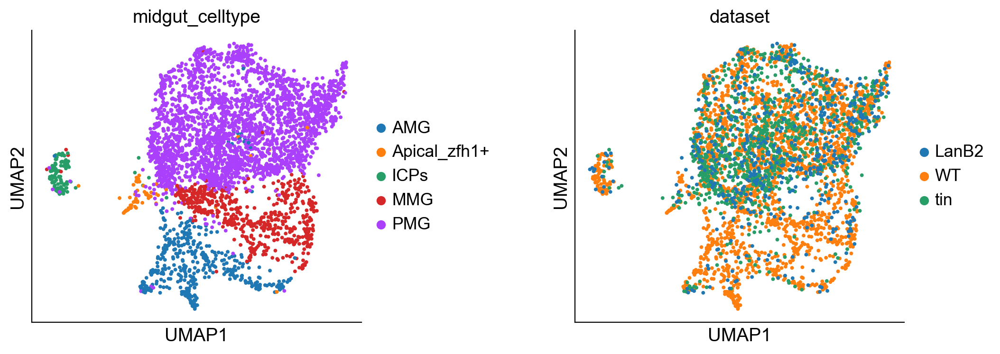

In [8]:
sc.pl.umap(adata, color=['midgut_celltype', 'dataset'], wspace=0.5)

In [ ]:
pmg = adata[adata.obs['midgut_celltype']=='PMG'].copy()
pmg

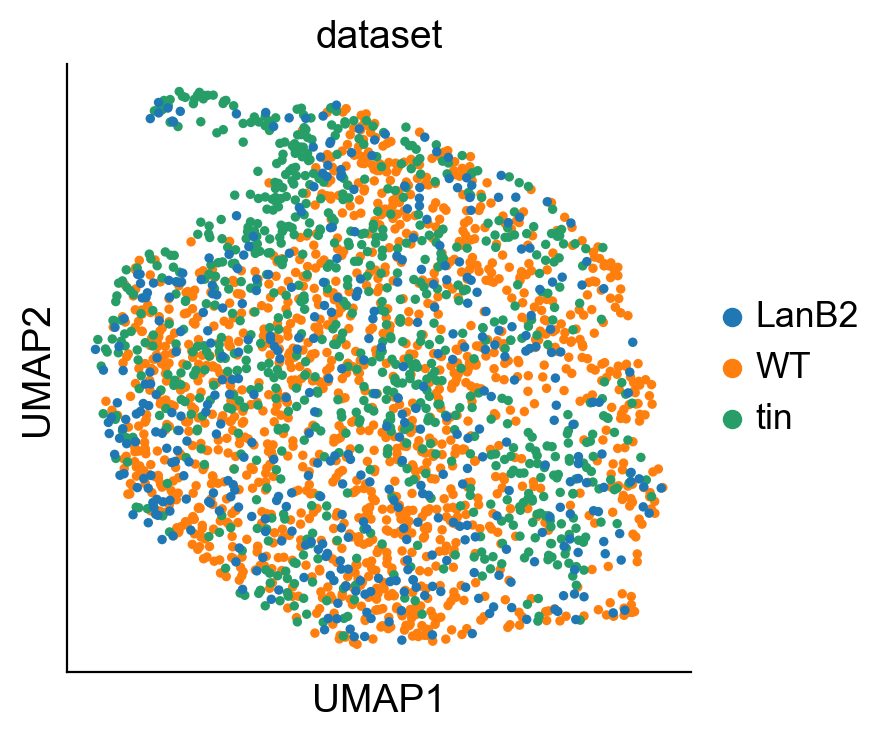

In [10]:
sc.pp.neighbors(pmg, n_pcs=25)
sc.tl.umap(pmg)
sc.pl.umap(pmg, color='dataset')

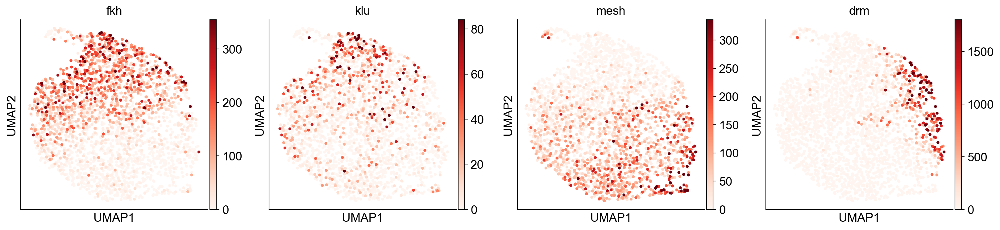

In [11]:
sc.pl.umap(pmg, color=['fkh', 'klu', 'mesh', 'drm'], cmap='Reds', vmax='p99')

In [ ]:
sc.tl.leiden(pmg, resolution=0.1, key_added='leiden_0.1')
sc.tl.leiden(pmg, resolution=0.2, key_added='leiden_0.2')
sc.tl.leiden(pmg, resolution=0.3, key_added='leiden_0.3')
sc.tl.leiden(pmg, resolution=0.4, key_added='leiden_0.4')
sc.tl.leiden(pmg, resolution=0.5, key_added='leiden_0.5')
sc.tl.leiden(pmg, resolution=0.6, key_added='leiden_0.6')
sc.tl.leiden(pmg, resolution=0.7, key_added='leiden_0.7')
sc.tl.leiden(pmg, resolution=0.8, key_added='leiden_0.8')
sc.tl.leiden(pmg, restrict_to=('leiden_0.8', ['3']), resolution=0.4, key_added='leiden_0.8_sub')

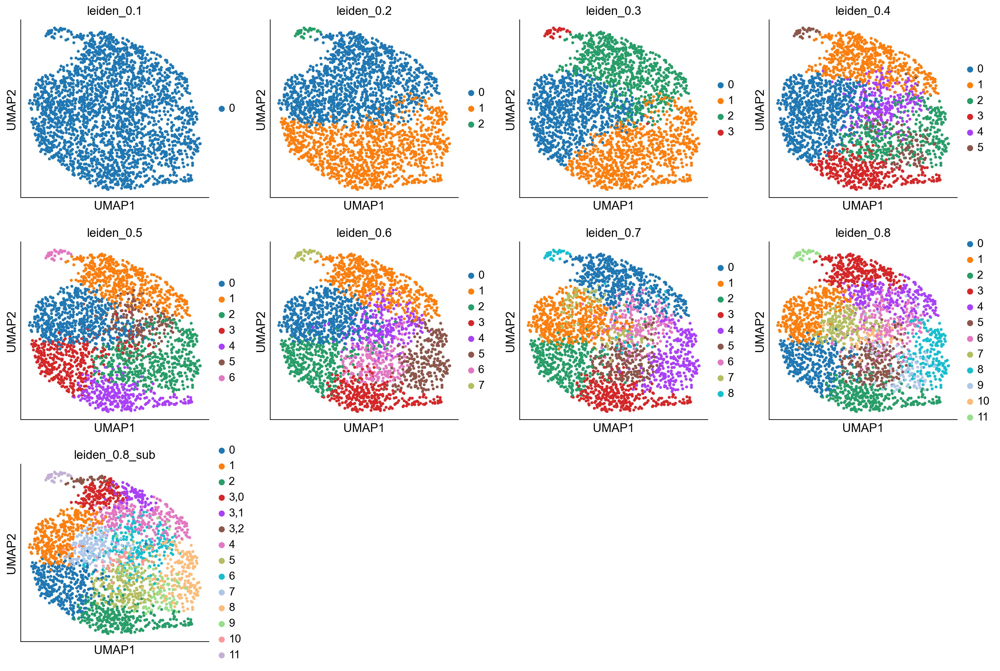

In [13]:
sc.pl.umap(pmg, color=['leiden_0.1', 'leiden_0.2', 'leiden_0.3', 'leiden_0.4', 'leiden_0.5', 'leiden_0.6', 'leiden_0.7', 'leiden_0.8',
                       'leiden_0.8_sub'])

In [ ]:
pmg.X

In [15]:
pmg.obs['batch'].unique()

['WT_01', 'WT_02', 'WT_03', 'WT_04', 'tin_01', 'tin_02', 'LanB_01', 'LanB_02']
Categories (8, object): ['LanB_01', 'LanB_02', 'WT_01', 'WT_02', 'WT_03', 'WT_04', 'tin_01', 'tin_02']

In [16]:
pmg.obs['dataset'].value_counts()

dataset
WT       1351
tin       815
LanB2     422
Name: count, dtype: int64

1) Bootstrap downsampling by dataset (your PMG-only object)

In [ ]:
def downsample_by_dataset(pmg, dataset_key="dataset", target_cells=422, seed=0):
    rng = np.random.default_rng(seed)
    cats = pmg.obs[dataset_key].cat.categories

    parts = []
    for cat in cats:
        ad = pmg[pmg.obs[dataset_key] == cat].copy()
        if ad.n_obs > target_cells:
            keep = rng.choice(ad.obs_names, size=target_cells, replace=False)
            ad = ad[keep].copy()
        parts.append(ad)

    out = parts[0].concatenate(
        *parts[1:], batch_key=dataset_key, batch_categories=cats
    )
    return out

2) Harmony + PCA + neighbors + DPT (one function)

In [ ]:
def run_harmony_dpt(
    adata,
    batch_key="batch",
    dataset_key="dataset",
    n_pcs=25,
    n_neighbors=12,          
    root_cluster=None,    
    cluster_key=None,
    random_state=0
):
    ad = adata.copy()


    # --- Harmony on PCA ---
    sc.external.pp.harmony_integrate(ad, key=batch_key)

    # --- neighbors on Harmony PCs ---
    sc.pp.neighbors(ad, use_rep="X_pca_harmony", n_neighbors=n_neighbors, n_pcs=n_pcs)
    sc.tl.umap(ad, random_state=random_state)


    # Using a stable cluster label to choose a start cell:
    if root_cluster is not None and cluster_key is not None:
        candidates = ad.obs_names[ad.obs[cluster_key] == root_cluster]
        if len(candidates) == 0:
            raise ValueError("No cells match root_cluster in this bootstrap.")
        # pick a deterministic “first” cell (stable). This will be used by tl.dpt
        chosen = sorted(candidates)[0]
        ad.uns["iroot"] = np.flatnonzero(ad.obs_names == chosen)[0]

    else:
        pass

    sc.tl.dpt(ad)  # calculates diffusion pseudotime

    return ad

3) Run B bootstraps + compute Spearman vs a reference

In [ ]:
B = 50
target_cells = 422
dataset_key = "dataset"
batch_key = "batch"

# stable root cluster approach
cluster_key = "leiden_0.8_sub"   # change to your cluster column
root_cluster = "3,0"            # change to the cluster you want as start

subs = []
ads = []
seeds = [42 + i for i in range(B)]

for s in seeds:
    sub = downsample_by_dataset(pmg, dataset_key=dataset_key, target_cells=target_cells, seed=s)
    subs.append(sub)

    ad = run_harmony_dpt(
        sub,
        batch_key=batch_key,
        n_pcs=25,
        n_neighbors=12,
        root_cluster=root_cluster,
        cluster_key=cluster_key,
    )
    ads.append(ad.copy())

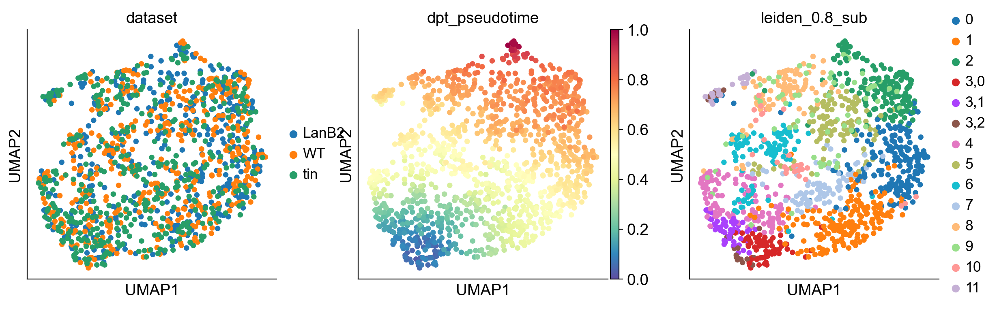

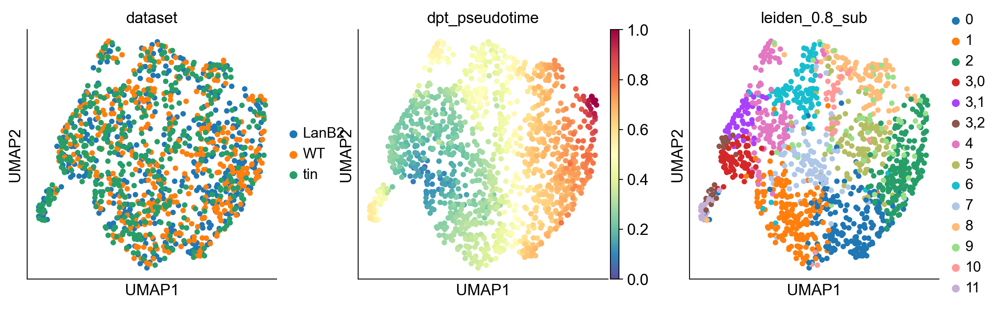

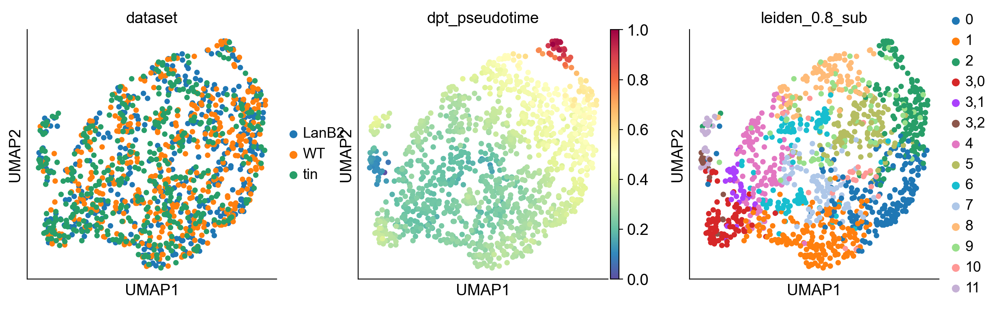

In [20]:
sc.pl.umap(ads[0], color=['dataset', 'dpt_pseudotime', 'leiden_0.8_sub'])
sc.pl.umap(ads[1], color=['dataset', 'dpt_pseudotime', 'leiden_0.8_sub'])
sc.pl.umap(ads[2], color=['dataset', 'dpt_pseudotime', 'leiden_0.8_sub'])

Now compare against the reference bootstrap (0):

In [ ]:
ref_pt = ads[0].obs['dpt_pseudotime']
ref_cells = ref_pt.index

scores = []
for i in range(1, B):
    pt = ads[i].obs['dpt_pseudotime']
    common = ref_cells.intersection(pt.index)

    r, _ = spearmanr(ref_pt.loc[common], pt.loc[common])
    scores.append(r)

print("Median Spearman vs bootstrap 0:", np.median(scores))

4) Pick a “representative” bootstrap run (closest to median)

In [ ]:
scores_all = [1.0]  # ref vs ref
for i in range(1, B):
    common = ads[0].obs.index.intersection(ads[i].obs.index)
    r, _ = spearmanr(ads[0].obs['dpt_pseudotime'].loc[common], ads[i].obs['dpt_pseudotime'].loc[common])
    scores_all.append(r)

scores_all = np.array(scores_all)

median_r = np.median(scores_all[1:])  # exclude the trivial 1.0
rep_idx = int(np.argmin(np.abs(scores_all - median_r)))

print("Representative bootstrap index:", rep_idx)
print("Seed:", seeds[rep_idx])
print("Spearman to ref:", scores_all[rep_idx])

pmg_rep = ads[rep_idx]  # choose this one for downstream analysis

In [ ]:
pmg_rep

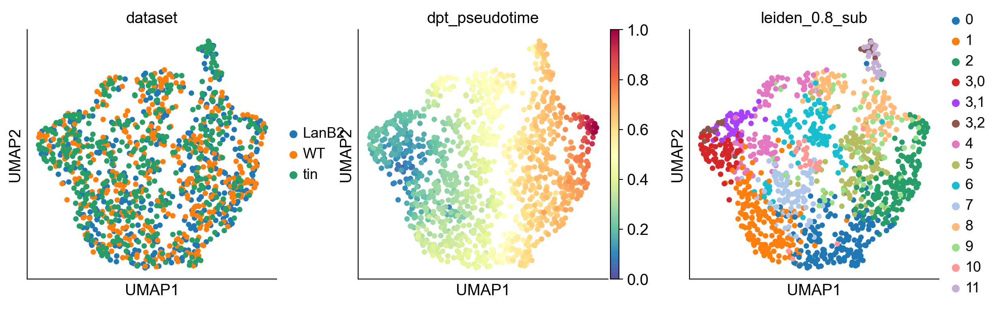

In [24]:
sc.pl.umap(pmg_rep, color=['dataset', 'dpt_pseudotime', 'leiden_0.8_sub'])

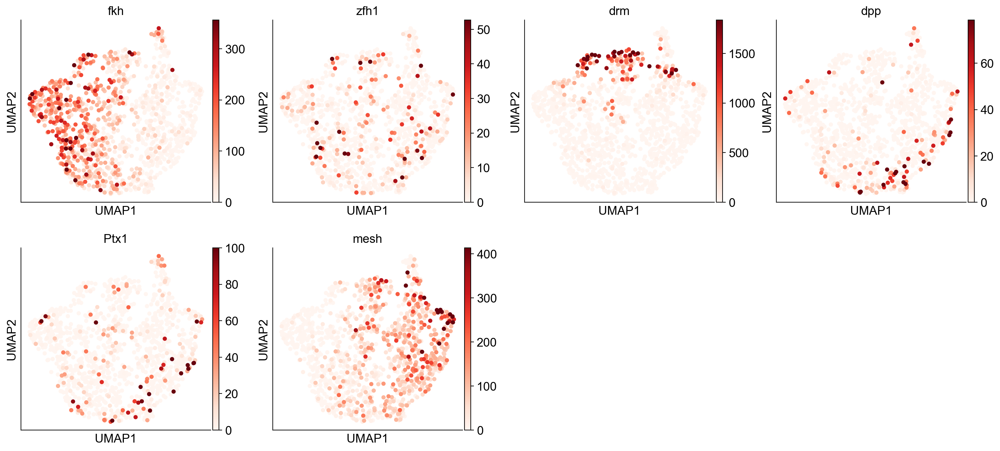

In [25]:
sc.pl.umap(pmg_rep, color=['fkh', 'zfh1', 'drm', 'dpp', 'Ptx1', 'mesh'], cmap='Reds', vmax='p99')

In [ ]:
pmg_rep.X

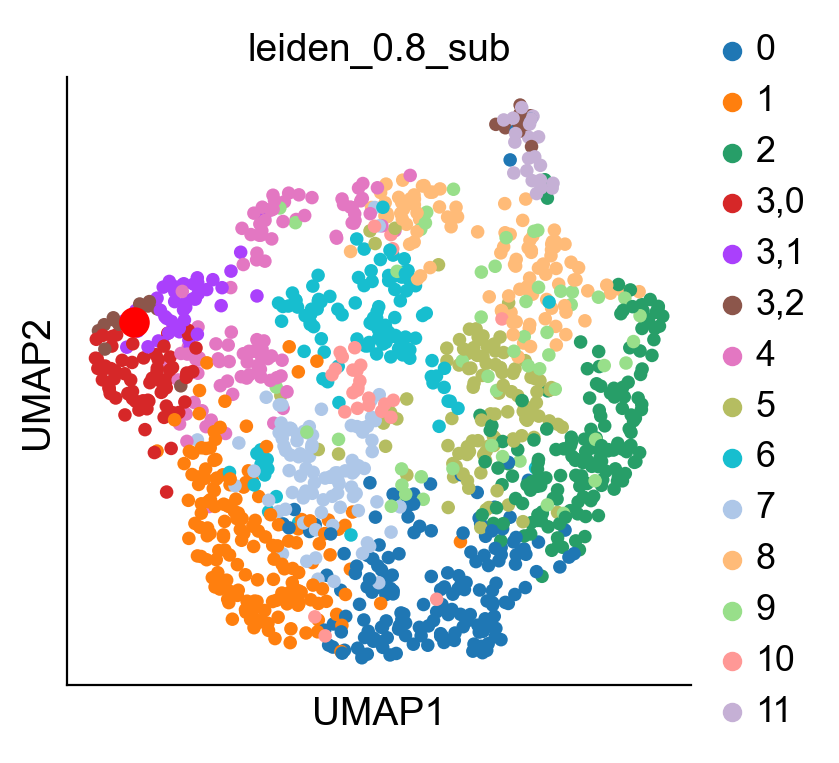

CATTCGGTTTCTGGTT-0-LanB_01-LanB2


In [27]:
# finding the earliest progenitor cell

geneA = 'fkh'
geneB = 'srp'

# Ensure the genes are in the dataset
if geneA in pmg_rep.var_names and geneB in pmg_rep.var_names:
    # Extract expression values
    geneA_expression = pmg_rep[:, geneA].X
    geneB_expression = pmg_rep[:, geneB].X
    
    
    # Calculate combined expression
    combined_expression = geneA_expression + geneB_expression
    
    # Find the cell index with the highest combined expression
    cell_idx = np.argmax(combined_expression)


barcode_of_interest = pmg_rep.obs_names[cell_idx]

# Check if the barcode exists
if barcode_of_interest in pmg_rep.obs_names:
    # Find the index of the barcode
    index_of_interest = pmg_rep.obs_names.get_loc(barcode_of_interest)
    
    # Generate UMAP plot
    sc.pl.umap(pmg_rep, color='leiden_0.8_sub', show=False)  # Adjust 'color' as needed for your analysis
    
    # Highlight the barcode of interest
    plt.scatter(pmg_rep.obsm['X_umap'][index_of_interest, 0], pmg_rep.obsm['X_umap'][index_of_interest, 1], 
                color='red', s=100, label='Barcode of Interest')  # Adjust color and size (s) as needed
    
    # Show the plot
    plt.show()
else:
    print(f"Barcode {barcode_of_interest} not found in the dataset.")

print(barcode_of_interest)

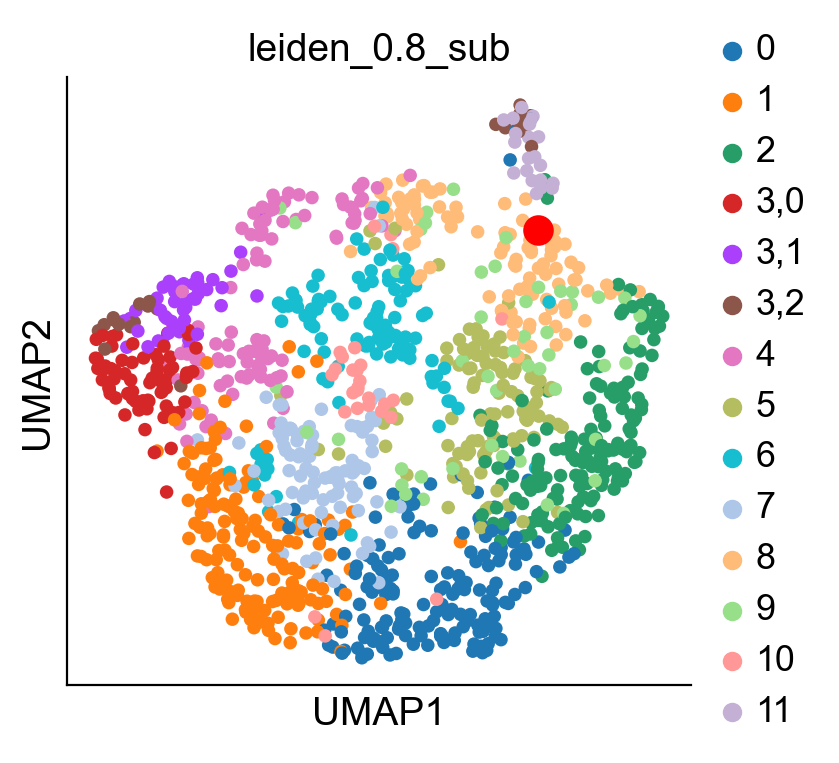

GCTGCTTCTGCCTACG-1-tin_02-tin


In [28]:
# finding the earliest progenitor cell

geneA = 'mesh'
geneB = 'slbo'

# Ensure the genes are in the dataset
if geneA in pmg_rep.var_names and geneB in pmg_rep.var_names:
    # Extract expression values
    geneA_expression = pmg_rep[:, geneA].X
    geneB_expression = pmg_rep[:, geneB].X
    
    
    # Calculate combined expression
    combined_expression = geneA_expression + geneB_expression
    
    # Find the cell index with the highest combined expression
    cell_idx = np.argmax(combined_expression)


barcode_of_interest = pmg_rep.obs_names[cell_idx]

# Check if the barcode exists
if barcode_of_interest in pmg_rep.obs_names:
    # Find the index of the barcode
    index_of_interest = pmg_rep.obs_names.get_loc(barcode_of_interest)
    
    # Generate UMAP plot
    sc.pl.umap(pmg_rep, color='leiden_0.8_sub', show=False)  # Adjust 'color' as needed for your analysis
    
    # Highlight the barcode of interest
    plt.scatter(pmg_rep.obsm['X_umap'][index_of_interest, 0], pmg_rep.obsm['X_umap'][index_of_interest, 1], 
                color='red', s=100, label='Barcode of Interest')  # Adjust color and size (s) as needed
    
    # Show the plot
    plt.show()
else:
    print(f"Barcode {barcode_of_interest} not found in the dataset.")

print(barcode_of_interest)

In [29]:
start_cell = 'CATTCGGTTTCTGGTT-0-LanB_01-LanB2'
terminal_states = ['GCTGCTTCTGCCTACG-1-tin_02-tin']

In [ ]:
dm = palantir.utils.run_diffusion_maps(pmg_rep, n_components=15, knn=12)

In [ ]:
ms_data = palantir.utils.determine_multiscale_space(pmg_rep)

In [ ]:
palantir.plot.plot_diffusion_components(pmg_rep)
plt.show()

In [ ]:
#running palantir
pr_res = palantir.core.run_palantir(
    pmg_rep, early_cell=start_cell, terminal_states=terminal_states
)

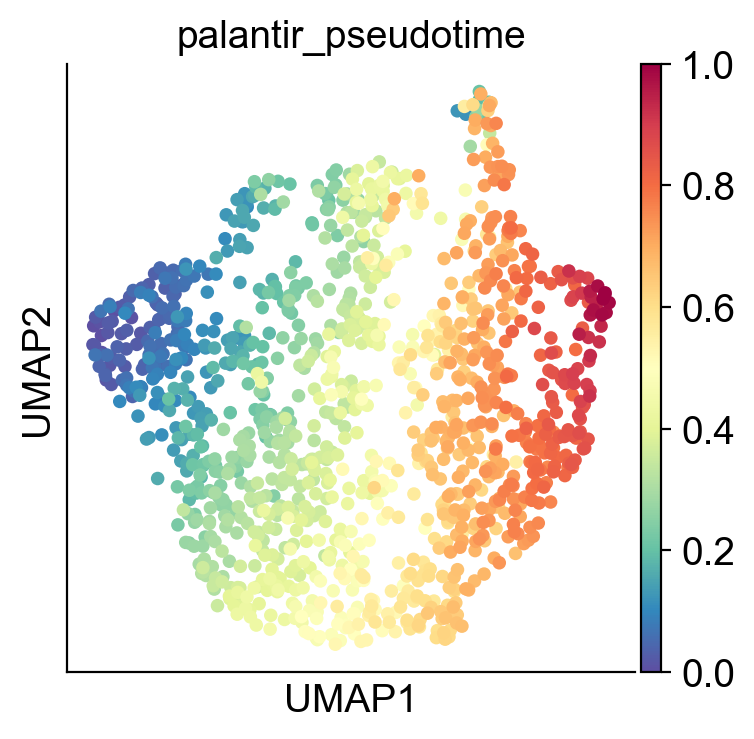

In [34]:
sc.pl.umap(pmg_rep, color='palantir_pseudotime')

In [ ]:
desired_gene = pd.read_csv('../data/processed/DEG_alongPs_cluster.csv', index_col=0)
desired_gene

In [ ]:
pmg_rep_raw = pmg_rep.raw.to_adata()
pmg_rep_raw

In [ ]:
pmg_rep_sub = pmg_rep_raw[:, pmg_rep_raw.var_names.isin(desired_gene['Gene'])]
pmg_rep_sub

In [ ]:
pmg_rep_sub.X

In [ ]:
pmg_rep_sub.layers['raw_counts'] = pmg_rep_sub.X.copy()

In [ ]:
sc.pp.normalize_total(pmg_rep_sub)
sc.pp.log1p(pmg_rep_sub)

In [ ]:
wt_lan = pmg_rep_sub[pmg_rep_sub.obs['dataset'].isin(['WT', 'LanB2'])]
wt_lan

In [ ]:
wt_tin = pmg_rep_sub[pmg_rep_sub.obs['dataset'].isin(['WT', 'tin'])]
wt_tin

In [ ]:
pseudotime_lan = pd.Series(data=wt_lan.obs['palantir_pseudotime'], index=wt_lan.obs_names)
pseudotime_lan

In [ ]:
pseudotime_tin = pd.Series(data=wt_tin.obs['palantir_pseudotime'], index=wt_tin.obs_names)
pseudotime_tin

In [ ]:
pseudotime_lan.to_csv('../data/processed/pseudotime_wt_lan.csv', header=False, index=True)
pseudotime_tin.to_csv('../data/processed/pseudotime_wt_tin.csv', header=False, index=True)

In [ ]:
wt_lan.to_df().to_csv('../data/processed/geneexpr_wt_lan.csv', header=True, index=True)
wt_tin.to_df().to_csv('../data/processed/geneexpr_wt_tin.csv', header=True, index=True)

In [ ]:
wt_lan.obs[['batch', 'dataset']].to_csv('../data/processed/metadata_wt_lan.csv', header=True, index=True)
wt_tin.obs[['batch', 'dataset']].to_csv('../data/processed/metadata_wt_tin.csv', header=True, index=True)

In [ ]:
pmg_rep_sub.X

In [ ]:
pmg_rep_sub.layers['logcounts']=pmg_rep_sub.X.copy()

In [ ]:
imputed_X = palantir.utils.run_magic_imputation(pmg_rep_sub, expression_key='logcounts')

In [ ]:
pmg_rep_sub.X = pmg_rep_sub.layers['MAGIC_imputed_data'].copy()

In [ ]:
#the expression values are MAGIC imputed data
pmg_rep_sub.X

In [ ]:
wt = pmg_rep_sub[pmg_rep_sub.obs['dataset']=='WT'].copy()

lan = pmg_rep_sub[pmg_rep_sub.obs['dataset']=='LanB2'].copy()

tin = pmg_rep_sub[pmg_rep_sub.obs['dataset']=='tin'].copy()

In [ ]:
expression_wt = wt.to_df()
expression_lan = lan.to_df()
expression_tin = tin.to_df()

In [ ]:
# Sort the DataFrame based on pseudotime
expression_sorted_wt = expression_wt.loc[wt.obs.sort_values('palantir_pseudotime').index]
expression_sorted_lan = expression_lan.loc[lan.obs.sort_values('palantir_pseudotime').index]
expression_sorted_tin = expression_tin.loc[tin.obs.sort_values('palantir_pseudotime').index]

In [ ]:
np.max(expression_sorted_wt)

In [ ]:
np.max(expression_sorted_lan)

In [ ]:
expression_sorted_wt = expression_sorted_wt[desired_gene['Gene']]
expression_sorted_lan = expression_sorted_lan[desired_gene['Gene']]
expression_sorted_tin = expression_sorted_tin[desired_gene['Gene']]

In [ ]:
expression_sorted_wt

In [ ]:
# Initialize the MinMaxScaler to scale between 0 and 1
scaler = MinMaxScaler()
expression_scaled_wt = pd.DataFrame(scaler.fit_transform(expression_sorted_wt), index=expression_sorted_wt.index, columns=expression_sorted_wt.columns)
scaler = MinMaxScaler()
expression_scaled_lan = pd.DataFrame(scaler.fit_transform(expression_sorted_lan), index=expression_sorted_lan.index, columns=expression_sorted_lan.columns)
scaler = MinMaxScaler()
expression_scaled_tin = pd.DataFrame(scaler.fit_transform(expression_sorted_tin), index=expression_sorted_tin.index, columns=expression_sorted_tin.columns)

In [ ]:
expression_scaled_wt = expression_scaled_wt.T
expression_scaled_lan = expression_scaled_lan.T
expression_scaled_tin = expression_scaled_tin.T

In [ ]:
np.max(expression_scaled_lan)

In [ ]:
np.max(expression_scaled_wt)

In [ ]:
clusters_new = desired_gene['gene_trends_clusters_new'].astype(int).values
clusters_new

In [ ]:
n_clusters = clusters_new.max()
palette = sns.color_palette("tab10", n_clusters)
cluster_cmap = ListedColormap(palette)

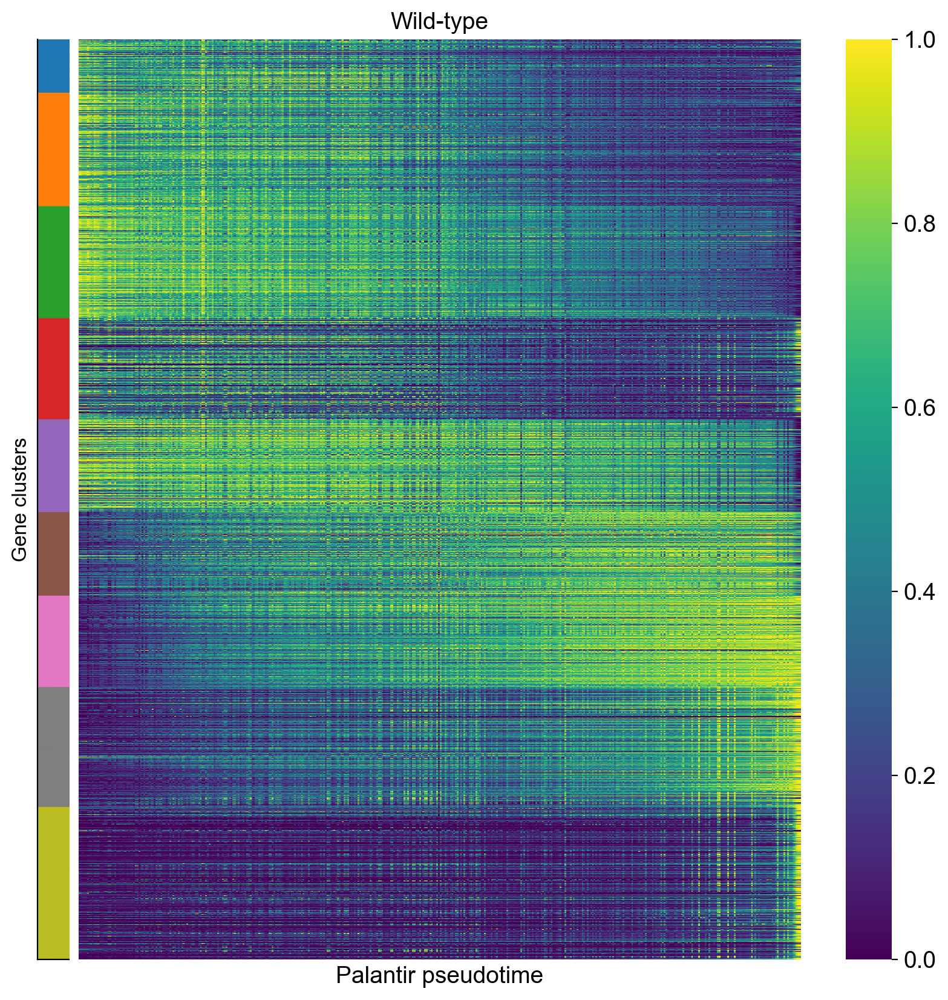

In [67]:
fig = plt.figure(figsize=(10, 10))
gs = fig.add_gridspec(1, 2, width_ratios=[0.35, 10], wspace=0.02)

# ---- Left: cluster annotation bar ----
ax_bar = fig.add_subplot(gs[0])
ax_bar.imshow(
    clusters_new.reshape(-1, 1),
    aspect="auto",
    cmap=cluster_cmap
)
ax_bar.set_xticks([])
ax_bar.set_yticks([])
ax_bar.set_ylabel("Gene clusters", fontsize=12)

# ---- Right: heatmap ----
ax_hm = fig.add_subplot(gs[1])
sns.heatmap(
    expression_scaled_wt,
    cmap="viridis",
    yticklabels=False,
    xticklabels=False,
    ax=ax_hm
)
ax_hm.set_xlabel("Palantir pseudotime")
ax_hm.set_title("Wild-type")

fig.savefig("../figures/wt_gene_trend_heatmap_compared.pdf", dpi=300, bbox_inches='tight')

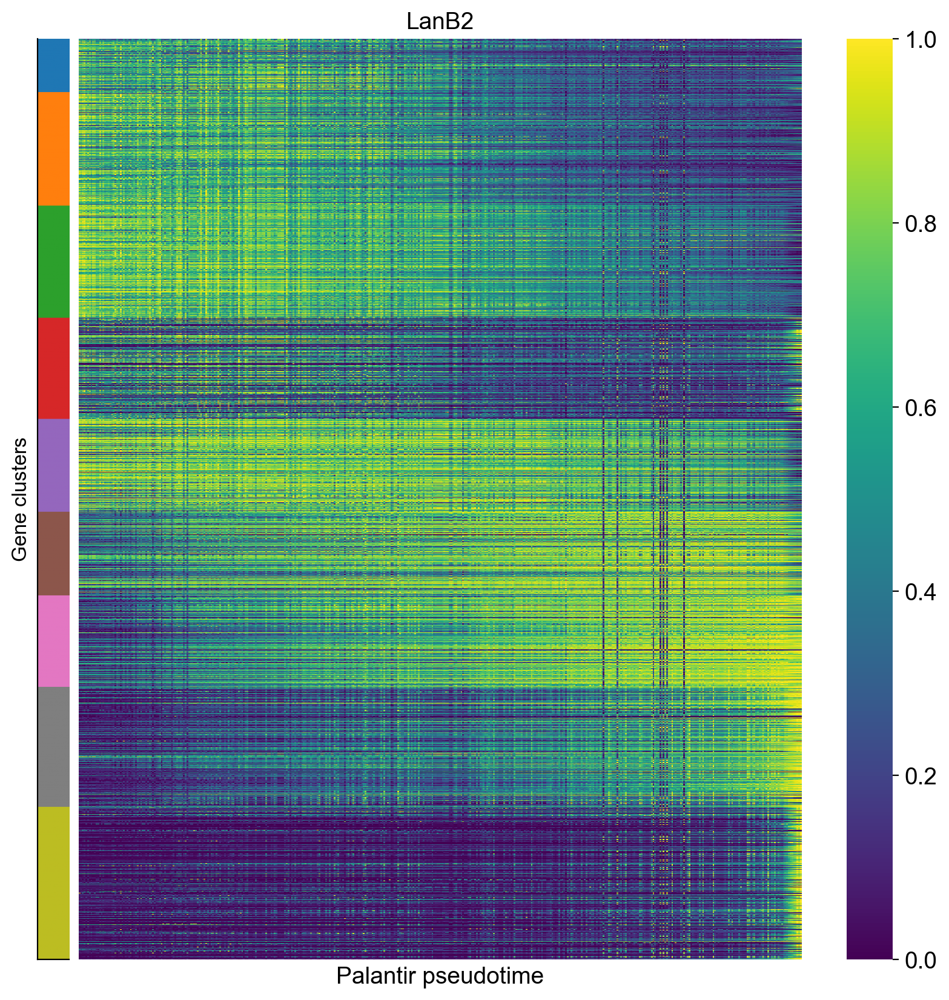

In [68]:
fig = plt.figure(figsize=(10, 10))
gs = fig.add_gridspec(1, 2, width_ratios=[0.35, 10], wspace=0.02)

# ---- Left: cluster annotation bar ----
ax_bar = fig.add_subplot(gs[0])
ax_bar.imshow(
    clusters_new.reshape(-1, 1),
    aspect="auto",
    cmap=cluster_cmap
)
ax_bar.set_xticks([])
ax_bar.set_yticks([])
ax_bar.set_ylabel("Gene clusters", fontsize=12)

# ---- Right: heatmap ----
ax_hm = fig.add_subplot(gs[1])
sns.heatmap(
    expression_scaled_lan,
    cmap="viridis",
    yticklabels=False,
    xticklabels=False,
    ax=ax_hm
)
ax_hm.set_xlabel("Palantir pseudotime")
ax_hm.set_title("LanB2")

fig.savefig("../figures/Lanb2_gene_trend_heatmap_compared.pdf", dpi=300, bbox_inches='tight')

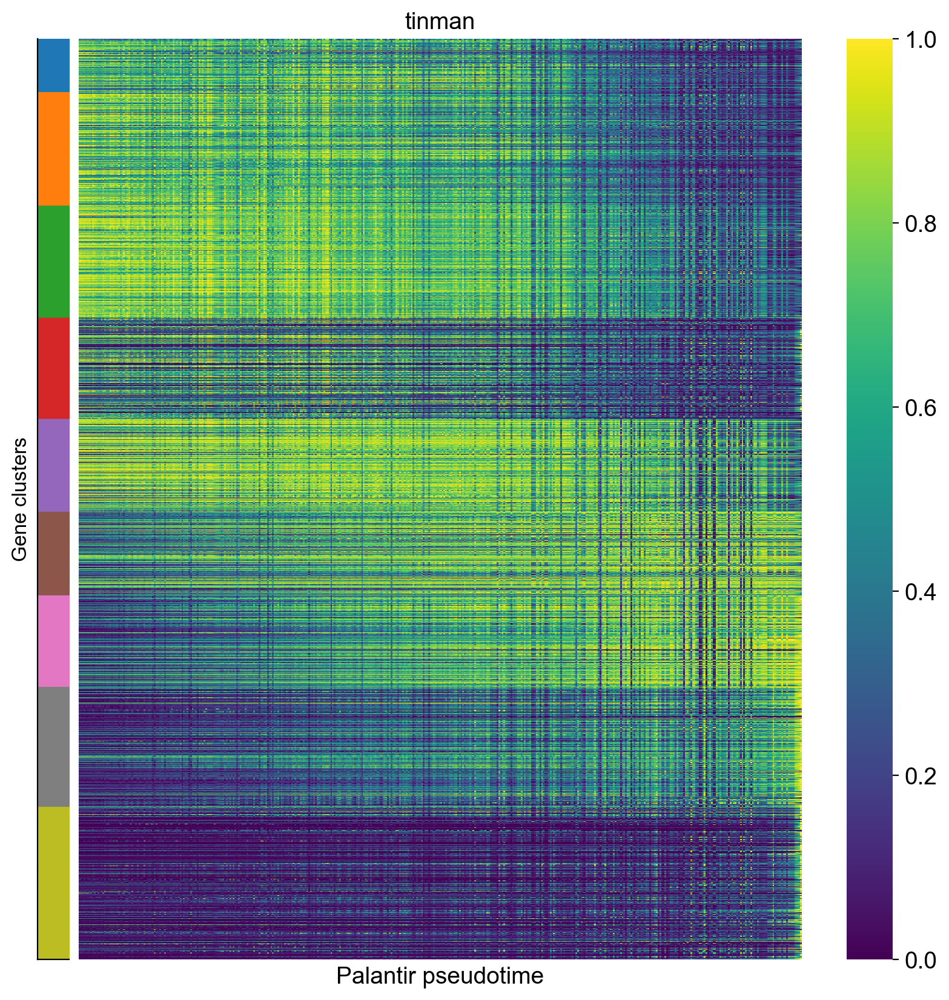

In [69]:
fig = plt.figure(figsize=(10, 10))
gs = fig.add_gridspec(1, 2, width_ratios=[0.35, 10], wspace=0.02)

# ---- Left: cluster annotation bar ----
ax_bar = fig.add_subplot(gs[0])
ax_bar.imshow(
    clusters_new.reshape(-1, 1),
    aspect="auto",
    cmap=cluster_cmap
)
ax_bar.set_xticks([])
ax_bar.set_yticks([])
ax_bar.set_ylabel("Gene clusters", fontsize=12)

# ---- Right: heatmap ----
ax_hm = fig.add_subplot(gs[1])
sns.heatmap(
    expression_scaled_tin,
    cmap="viridis",
    yticklabels=False,
    xticklabels=False,
    ax=ax_hm
)
ax_hm.set_xlabel("Palantir pseudotime")
ax_hm.set_title("tinman")

fig.savefig("../figures/tin_gene_trend_heatmap_compared.pdf", dpi=300, bbox_inches='tight')

In [ ]:
XDE_lan = pd.read_csv('../data/processed/XDE_wt_lan.csv')
XDE_tin = pd.read_csv('../data/processed/XDE_wt_tin.csv')

In [ ]:
expr_xde_tin = expression_scaled_tin[expression_scaled_tin.index.isin(XDE_tin['gene'])]
expr_xde_tin

In [ ]:
expr_xde_wt = expression_scaled_wt[expression_scaled_wt.index.isin(XDE_tin['gene'])]

Text(0.5, 1.0, 'tinman')

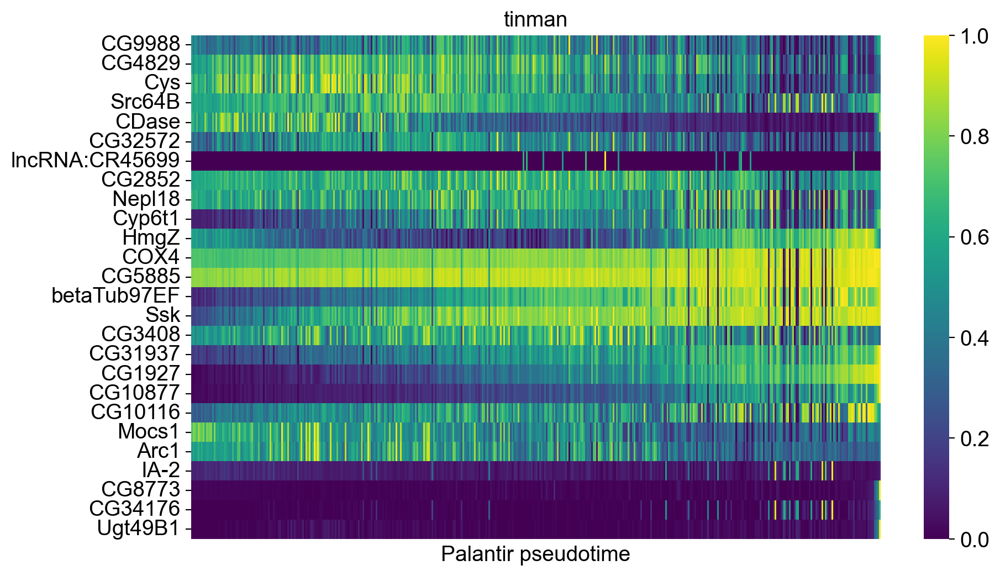

In [73]:
fig = plt.figure(figsize=(10, 6))

ax = sns.heatmap(
    expr_xde_tin,
    cmap="viridis",
    yticklabels=True,
    xticklabels=False
)
ax.yaxis.grid(False)
ax.xaxis.grid(False)
ax.set_xlabel("Palantir pseudotime")
fig.savefig("../figures/tin_gene_trend_heatmap_XDE.pdf", dpi=300, bbox_inches='tight')
ax.set_title("tinman")


Text(0.5, 1.0, 'Wild-type')

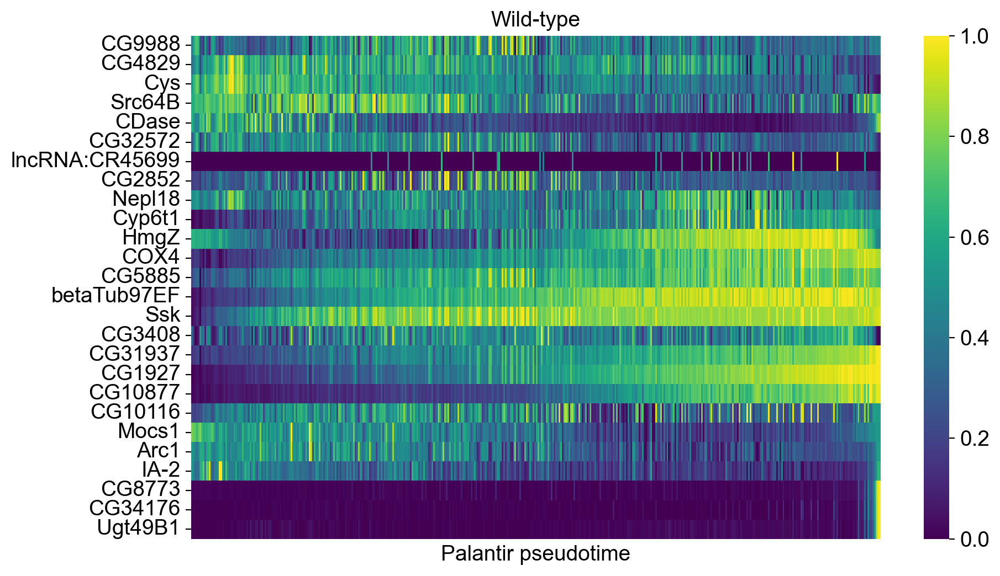

In [74]:
fig = plt.figure(figsize=(10, 6))

ax = sns.heatmap(
    expr_xde_wt,
    cmap="viridis",
    yticklabels=True,
    xticklabels=False,
)
ax.yaxis.grid(False)
ax.xaxis.grid(False)
ax.set_xlabel("Palantir pseudotime")
fig.savefig("../figures/tin_gene_trend_heatmap_XDE_wt.pdf", dpi=300, bbox_inches='tight')
ax.set_title("Wild-type")


In [ ]:
expr_xde_lan = expression_scaled_lan[expression_scaled_lan.index.isin(XDE_lan['gene'])]

In [ ]:
expr_xde_wt = expression_scaled_wt[expression_scaled_wt.index.isin(XDE_lan['gene'])]

Text(0.5, 1.0, 'LanB2')

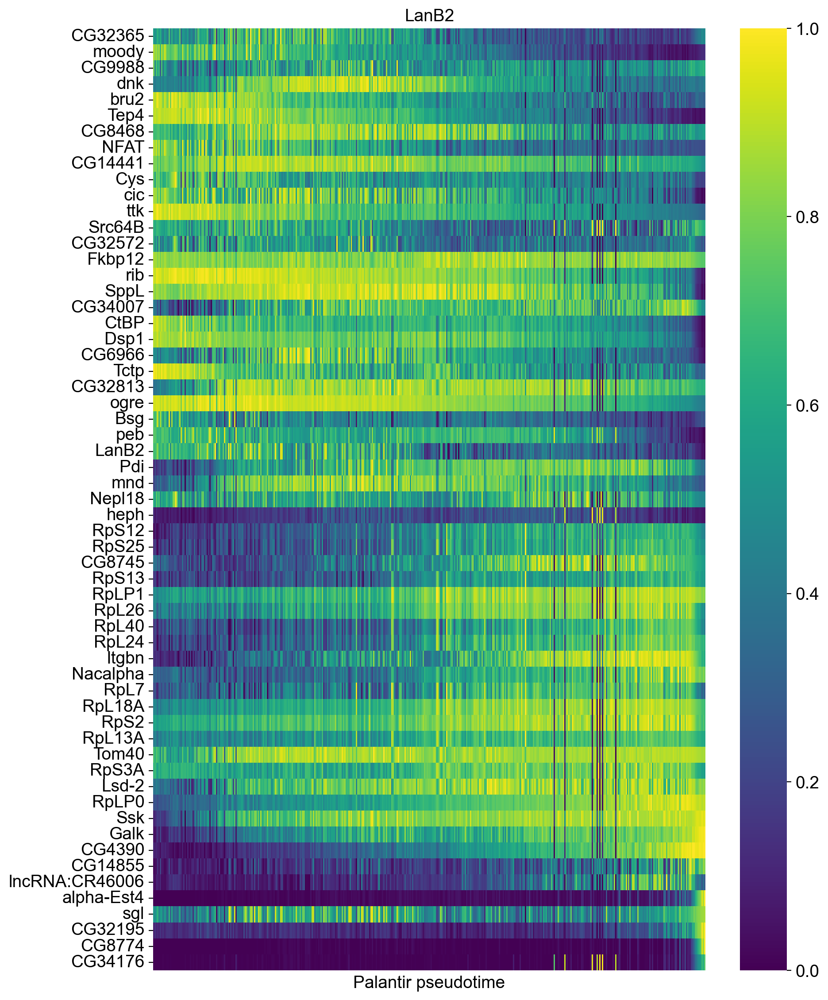

In [77]:
fig = plt.figure(figsize=(10, 14))

ax = sns.heatmap(
    expr_xde_lan,
    cmap="viridis",
    yticklabels=True,
    xticklabels=False,
)
ax.yaxis.grid(False)
ax.xaxis.grid(False)
ax.set_xlabel("Palantir pseudotime")
fig.savefig("../figures/lan_gene_trend_heatmap_XDE.pdf", dpi=300, bbox_inches='tight')
ax.set_title("LanB2")

Text(0.5, 1.0, 'Wild-type')

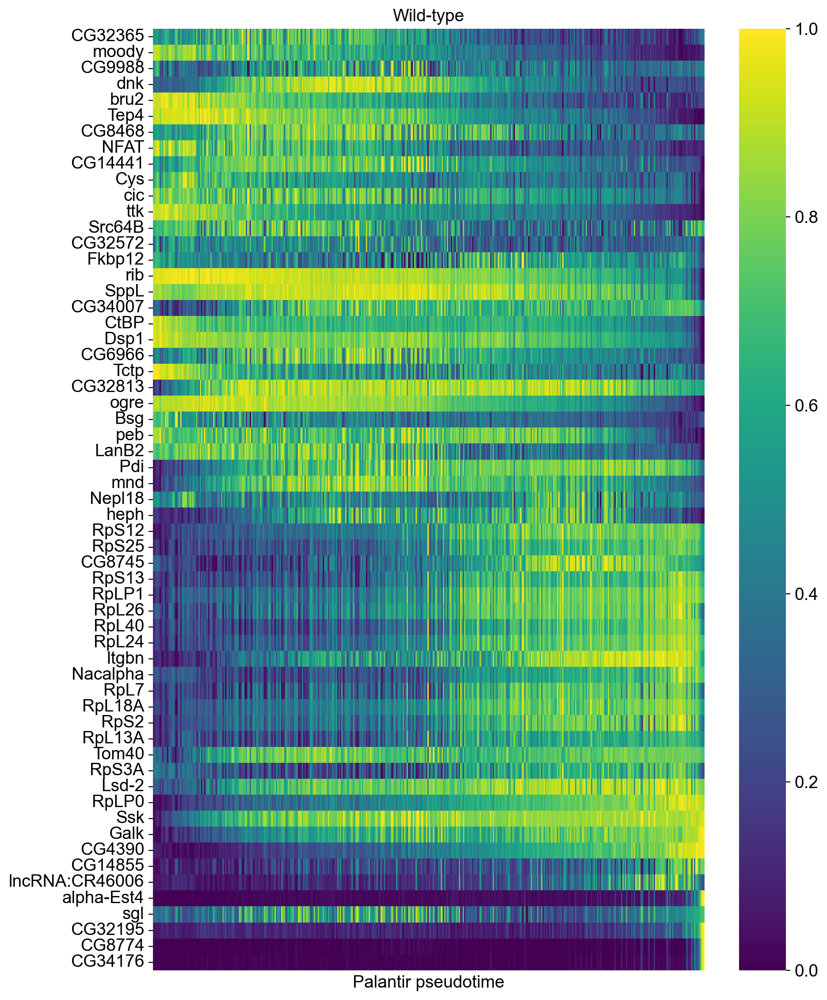

In [78]:
fig = plt.figure(figsize=(10, 14))

ax = sns.heatmap(
    expr_xde_wt,
    cmap="viridis",
    yticklabels=True,
    xticklabels=False,
)
ax.yaxis.grid(False)
ax.xaxis.grid(False)
ax.set_xlabel("Palantir pseudotime")
fig.savefig("../figures/lan_gene_trend_heatmap_XDE_wt.pdf", dpi=300, bbox_inches='tight')
ax.set_title("Wild-type")